In [2]:
# This is for processing video stimulus (ie. the sparse noise movie)
# Not suitable for trial based stimulus (ie, gradients, 6x4 ,etc) generated through psychstimbox

In [3]:
import os
from pathlib import Path

#from analysis_module.util import Getdata
from analysis_module import util, constants
import analysis_module as am

# import analysis & plotting related modules
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps as cm
from matplotlib.backends.backend_pdf import PdfPages # import pdfpage for saving figures as multipage pdf
import scipy
import pandas as pd
from tqdm import tqdm
from sklearn.preprocessing import minmax_scale

import tkinter.filedialog
import tkinter as tk
# import user interface module

## File loading and pre-processing

Extract frame info, stimulus event and s2p result  

Link stimulus event to frame range (stim_pd), extracts s2p ROI based on user defined probability (selected_index), median filter and normalize selected ROI (celldff)

In [5]:
# read sbx file and metadata
#sbxfile= r'D:\Anne\Data_from_Angelique\Data\120123\9\120123_octo_cal520_000_009.sbx'
sbxfile=tk.filedialog.askopenfile(title= 'Select the .sbx file' ,filetypes =[("Scan box files", "*.sbx")])

# load stimulus session data
#acquisition= scipy.io.loadmat(r'D:\Anne\Data_from_Angelique\Data\120123\9\120123_acq9.mat')
acq_mat= tk.filedialog.askopenfile(title= 'Select the .mat stimulus file associated with the acquisition', filetypes =[('Matlab file', '*.mat')])

# Load in s2p result files
#folder= r'D:\Anne\Data_from_Angelique\Data\120123\9\suite2p\plane0\ops0\\'
folder= tk.filedialog.askdirectory(title= 'Select the folder containing s2p results, typically plane\ops0\\' )

In [6]:
# load sbx
this_metadata,this_info= am.get_sbx(sbxfile)

# load stimulus session data
acquisition= scipy.io.loadmat(acq_mat.name)

# Load in s2p result files

F = np.load(os.path.join(folder, 'F.npy'), allow_pickle=True)
Fneu = np.load(os.path.join(folder, 'Fneu.npy'), allow_pickle=True)
#spks = np.load(os.path.join(folder, 'spks_original.npy'), allow_pickle=True)
stat = np.load(os.path.join(folder, 'stat.npy'), allow_pickle=True)
ops =  np.load(os.path.join(folder, 'ops.npy'), allow_pickle=True)
ops = ops.item()
iscell = np.load(os.path.join(folder, 'iscell.npy'), allow_pickle=True)

print(f'SBX file name: {sbxfile.name}')
print(f'Acquisition file name: {acq_mat.name}')

print('Finished loading acquisition and s2p results')

SBX file name: D:/Anne/Data_from_Angelique/Data/071224/acq2/071224_octo_cal520_000_002.sbx
Acquisition file name: D:/Anne/Data_from_Angelique/Data/071224/acq2/acq2.mat
Finished loading acquisition and s2p results


In [7]:
# assign info into stimulus class
stimulus= util.Getdata(this_metadata, this_info)

# parse out .mat file associated with sbx recording, get event times based on TTL signals
fr, phasesync, phasetimes, frsync, videoframetimes = am.parse_events(stimulus)

In [8]:
# load and preprocess stimulus movie
m, m_full, sz_m= util.load_snmovie()
print(f'size of movie array {m.shape}')

size of movie array (256, 192, 600)


In [9]:
cycwindow, startFrame, stimFrames, framerange= am.parse_sn(videoframetimes, stimulus) # parse out recording frames associated with each stimulus frame

In [10]:
# Grab master folder, ie. 3 folders up from the ops folder
p= Path(folder).parents[2].__str__()


In [11]:
# grab recording session name from sbxfile
result_name= Path(sbxfile.name).name[:-4]
# Instantiating pdf document
PDF = PdfPages(f'{p}\\{result_name}_results.pdf')

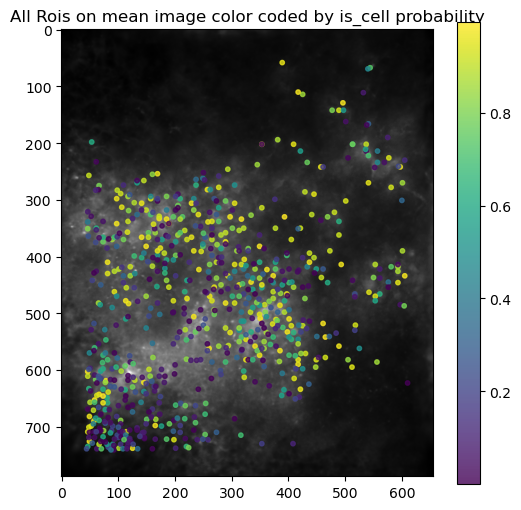

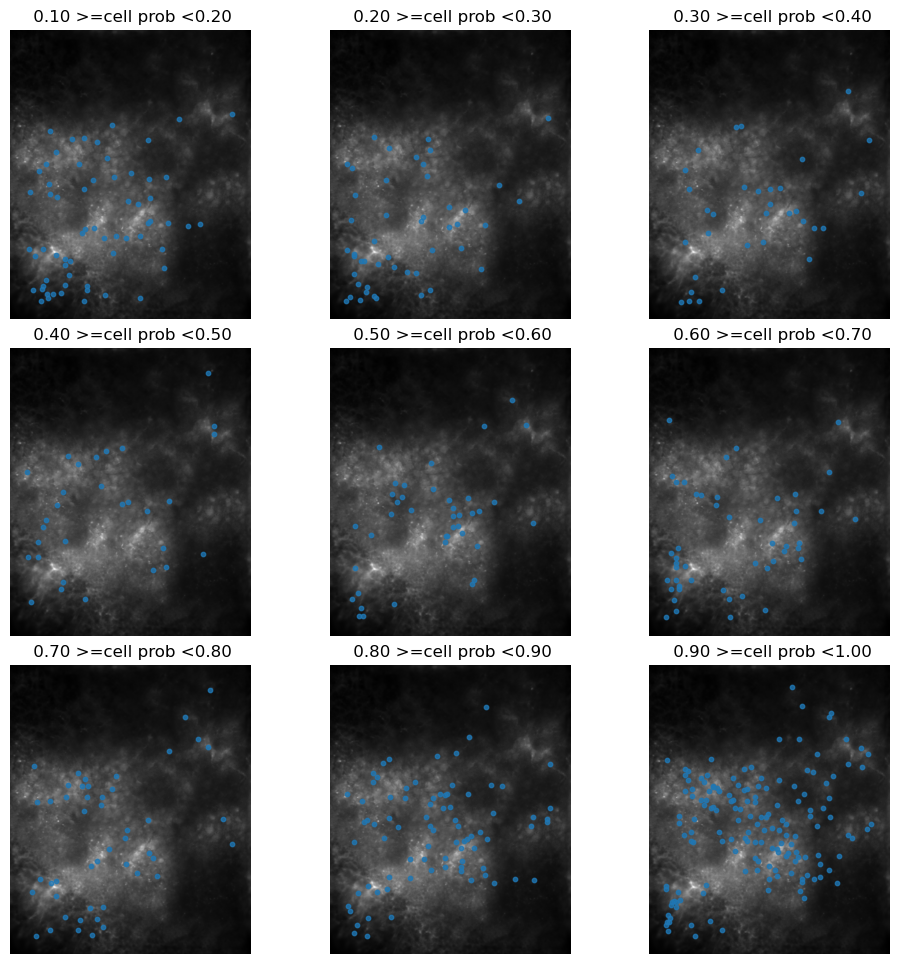

In [12]:
# preprocess s2p roi traces (iscell probability filter, normalization of dye loading using median)

fig, fig2= am.plot_s2proi(stat,iscell,ops)
PDF.savefig(fig) # save in pdf
PDF.savefig(fig2)

In [13]:
iscell_thresh= float( input('Select threshold based on s2p cell probability (0 < x <= 1):'))

while not 0 < iscell_thresh <=1:
    print('Must be an integer or float between 0 and 1, please enter again ')
    iscell_thresh= float( input('Define is cell threshold (ie. 0.5):'))

print(f'Selected iscell threshold is {iscell_thresh}')

prob_cell=iscell.T[1]
selected_index= np.argwhere(prob_cell>iscell_thresh)
print(f'There are {len(selected_index)} rois above the probability threshold')

Select threshold based on s2p cell probability (0 < x <= 1): 0.5


Selected iscell threshold is 0.5
There are 372 rois above the probability threshold


there are 372 cells out of total identified structure 748
excluding weird fluorescent traces that have nans as median, the remaining good traces are 365


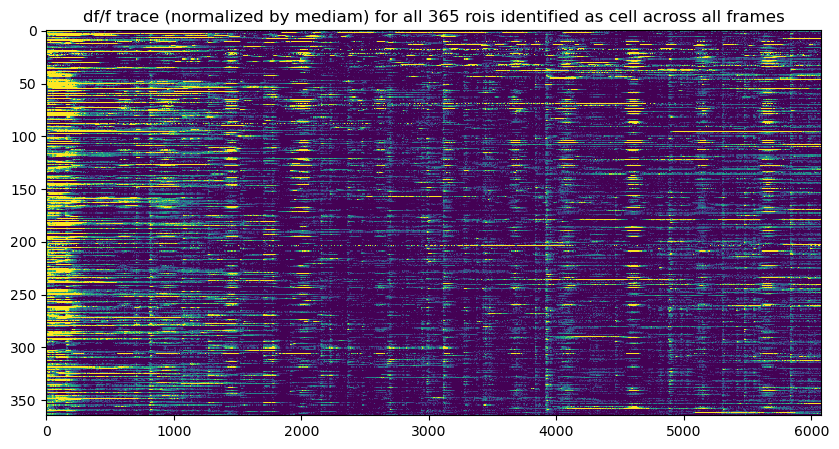

In [14]:
celldff, celldff1= am.norm_fluorescence(F, selected_index)

fig = plt.figure(figsize=(10, 5))
plt.imshow(celldff, vmin=0, vmax=0.3, aspect='auto',interpolation='none')
plt.title (f'df/f trace (normalized by mediam) for all {celldff.shape[0]} rois identified as cell across all frames')

# save in pdf
PDF.savefig(fig)
plt.show()


## roi based analysis

In [16]:
# get constants such as frames of offsets, baseline franmes, evaluation frames

offset= constants.offset_sn
baseRange=constants.baseRange
evRange= constants.evRange_sn

tau= constants.tau
tau_range=constants.tau_range # goes from -4 up to 4 (not including 5)

In [17]:
celldff=celldff[:,startFrame:] 
# get rid of the begining frames thats happening before stimulus onset
print(f'excluding {startFrame} frames in the begining before stimulus starts')


excluding 89 frames in the begining before stimulus starts


In [18]:
framerange=np.arange(0, cycwindow+1)

dFalign=np.zeros((len(stimFrames[:-2]), len(framerange),int(celldff.shape[0])))
# this array is now organized as totaltime(s), frameframe range- ie. takes frame number 10 and the next 20 frames after
# stores the mean dfof from cells within this cluster across time

for i in tqdm(np.arange(0, celldff.shape[0])):
    for count,item in enumerate(stimFrames[:-2]):
        # does not count the last 2 stim frame- replica from matlab
        
        this_range= (item+framerange-1).astype('int') # get a range of frames centered aound each stimframe
        
        dFalign[count,:, i ]= celldff[i,this_range[0]:this_range[-1]+1]- np.nanmean(celldff[i,this_range[0]:this_range[0]+baseRange[-1]+1])
        # do a Dfof for this range using baseline of 2 frames for each cycle

print('shape of the resulting array is nstimulus(time in second), frame range, nroi')
print(dFalign.shape)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 365/365 [00:03<00:00, 116.89it/s]

shape of the resulting array is nstimulus(time in second), frame range, nroi
(591, 21, 365)


In [19]:
framerange_tau=tau+tau_range
# a window centered around tau

resp= np.nanmean(dFalign[:,framerange_tau,:],1 )
resp=resp.T # rearramge into nroi x frames
resp.shape

(365, 591)

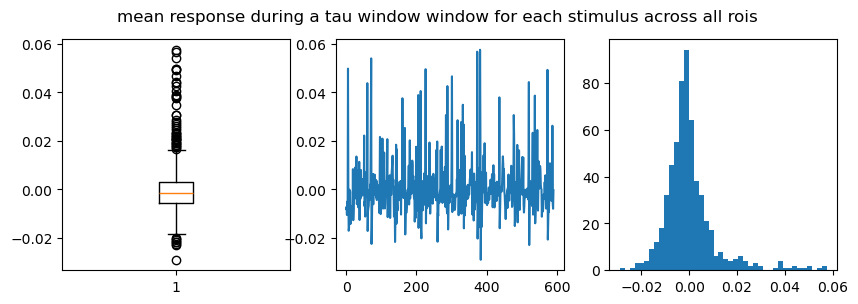

In [20]:
# for testing purpose only, delete later
fig, axs=plt.subplots(1,3, figsize=(10,3))
axs[0].boxplot(np.mean(resp,0))
axs[1].plot(np.mean(resp,0))
axs[2].hist(np.mean(resp,0), bins='auto')
# find distribution of resp

fig.suptitle('mean response during a tau window window for each stimulus across all rois')
PDF.savefig(fig)

<Figure size 640x480 with 0 Axes>

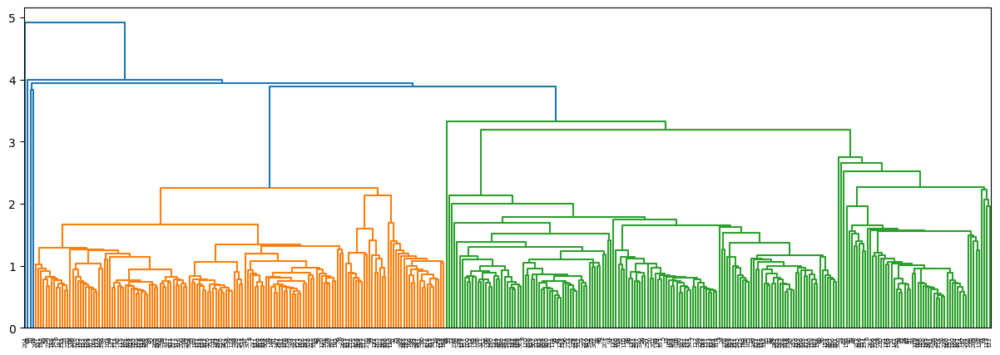

D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


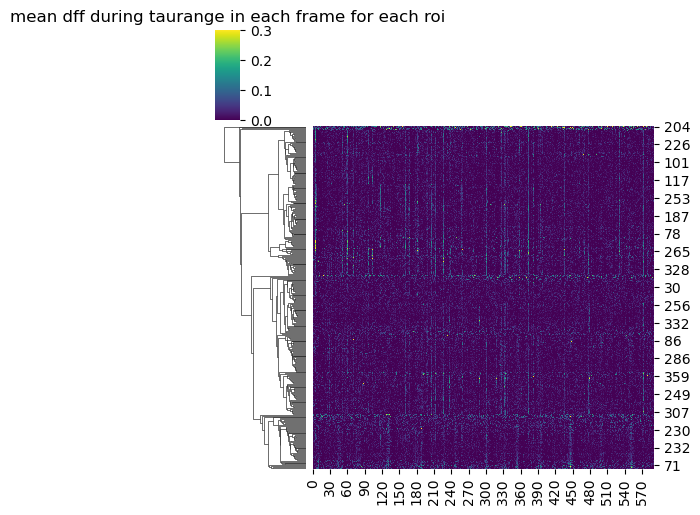

In [21]:
Z,fig=am.response_cluster_sn(resp)
PDF.savefig(fig, bbox_inches='tight')

In [22]:
while True: 
    big_cluster,t = am.define_cluster(Z)
    cluster_confirm= input('Press enter to continue, press anything else to to redefine cutoff:')
    if cluster_confirm =="":
        break
    else:
        print("retry")

Input cut off level based on dendrogram (int or decimal >0):  3


number of arbitrary cluster= 8


Press enter to continue, press anything else to to redefine cutoff: 


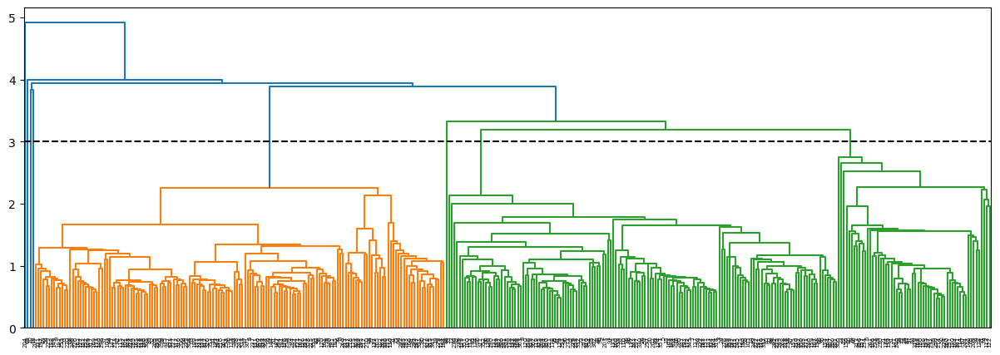

In [23]:
# cluster
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster 

fig, ax=plt.subplots(figsize=(15, 5))
dn = dendrogram(Z)
ax.axhline(t,ls= '--', c='k')
# plot a horizontal cut off line to the dendrogram

# save in pdf
PDF.savefig(fig)

plt.show()

Plotting positions of rois in each cluster


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.93it/s]


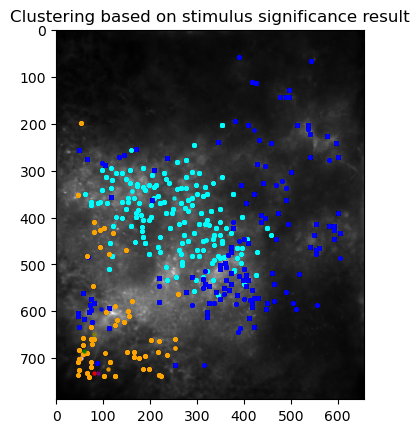

In [49]:
cellstat=stat[selected_index.flatten()]
# stat from structures pre-selected (ie. by a defined threshold of iscell probability)

cellstat=cellstat[~np.isnan(celldff1.min(axis=1))]
# also remove those indices that were dividing by zero during our celldff process

fig= am.plot_clust_roi(big_cluster, cellstat,ops)
# plot out the roi location

# save in pdf
PDF.savefig(fig)

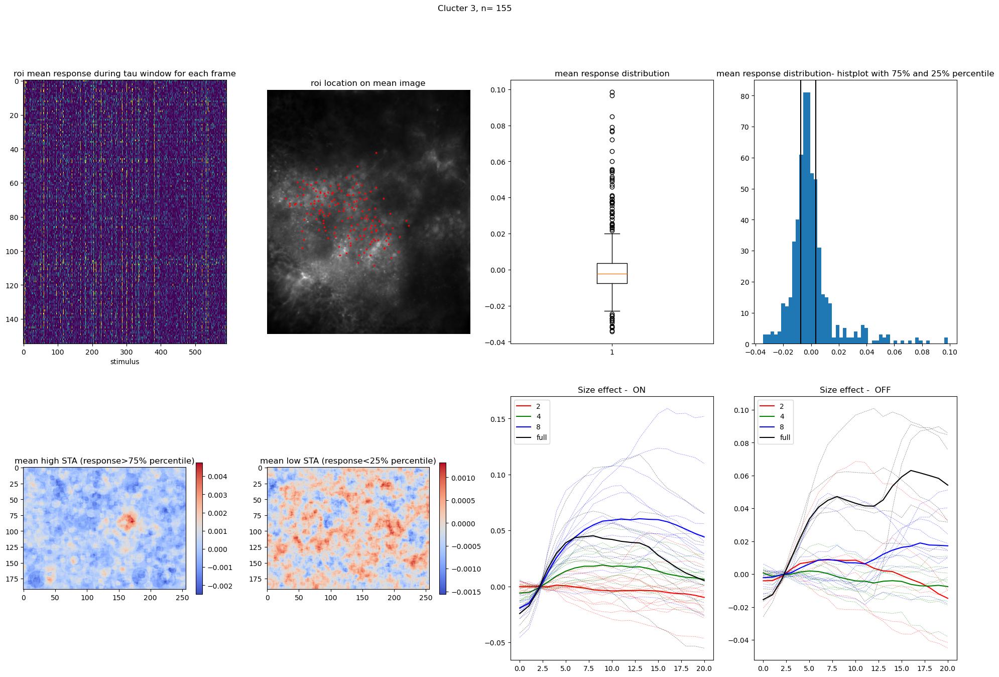

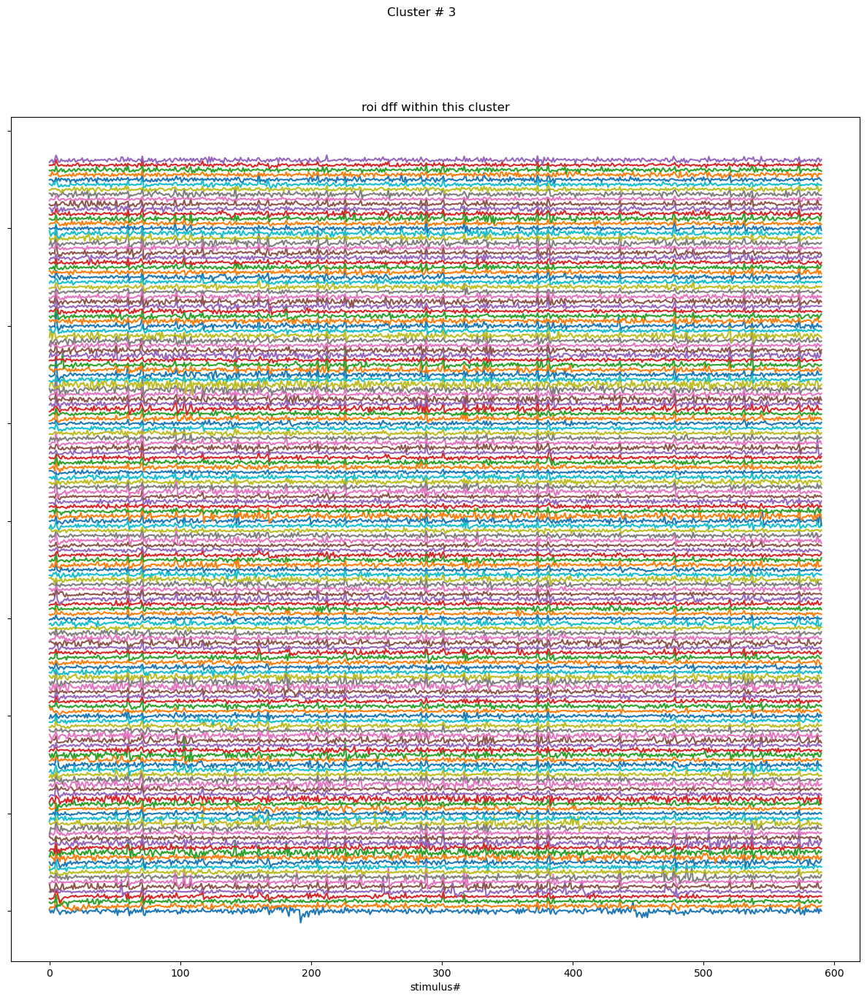

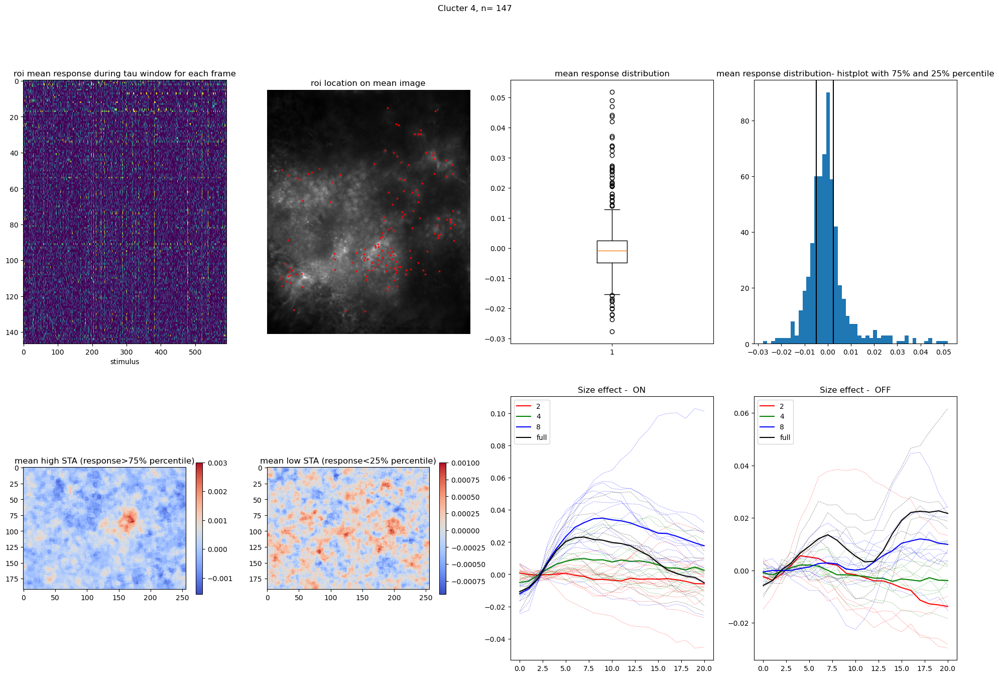

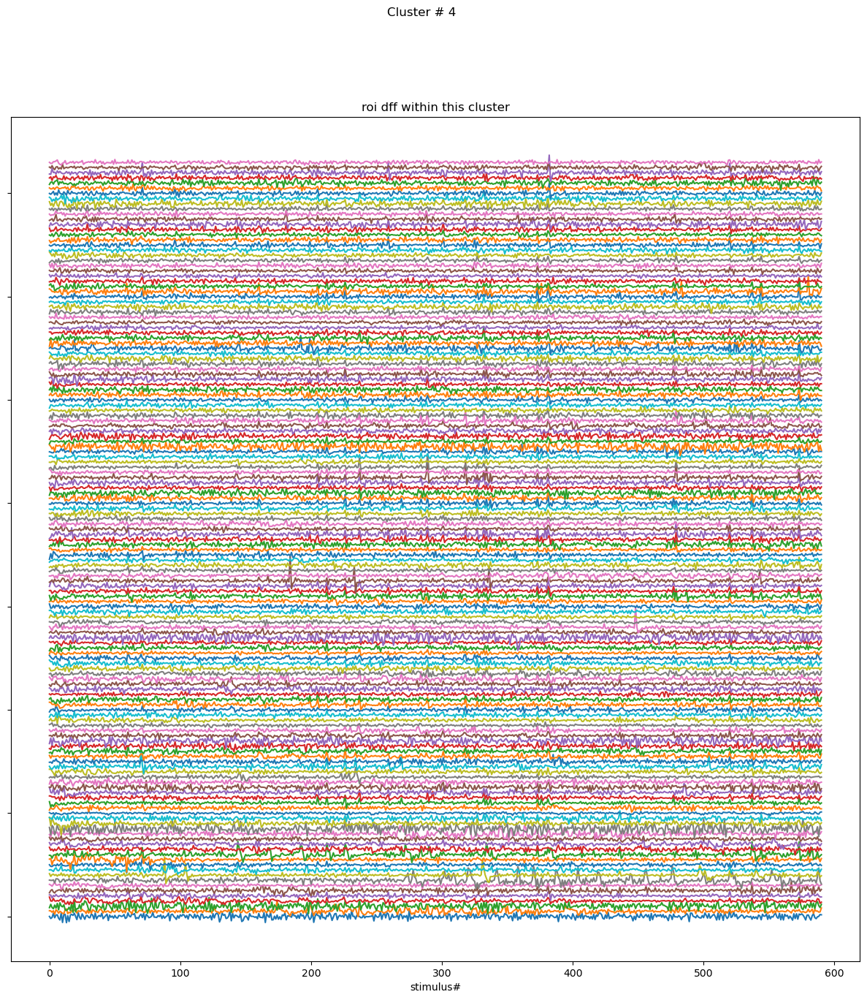

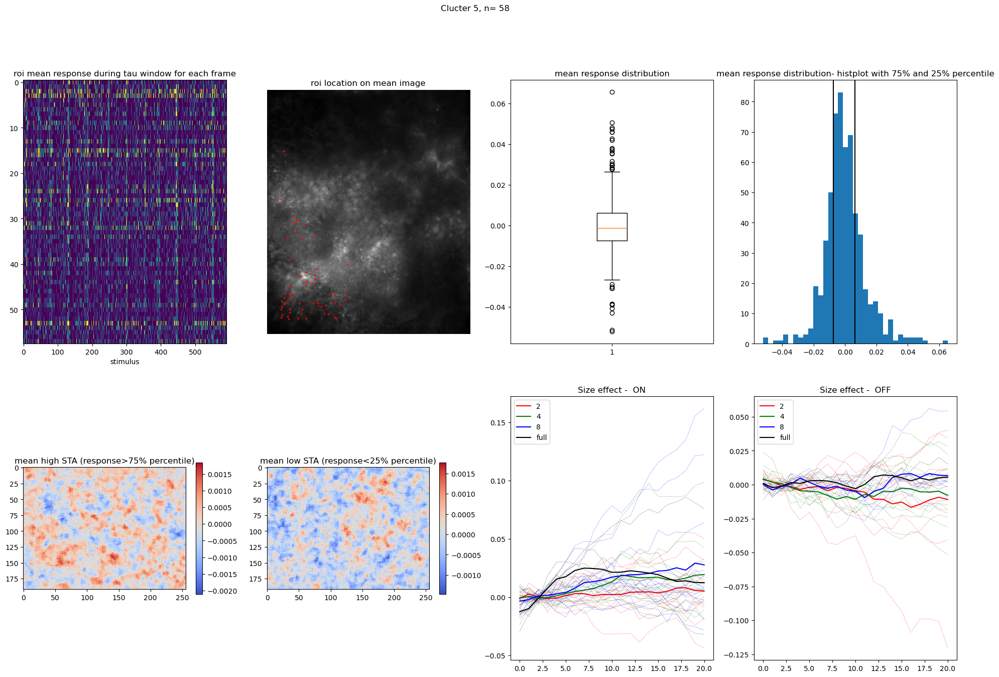

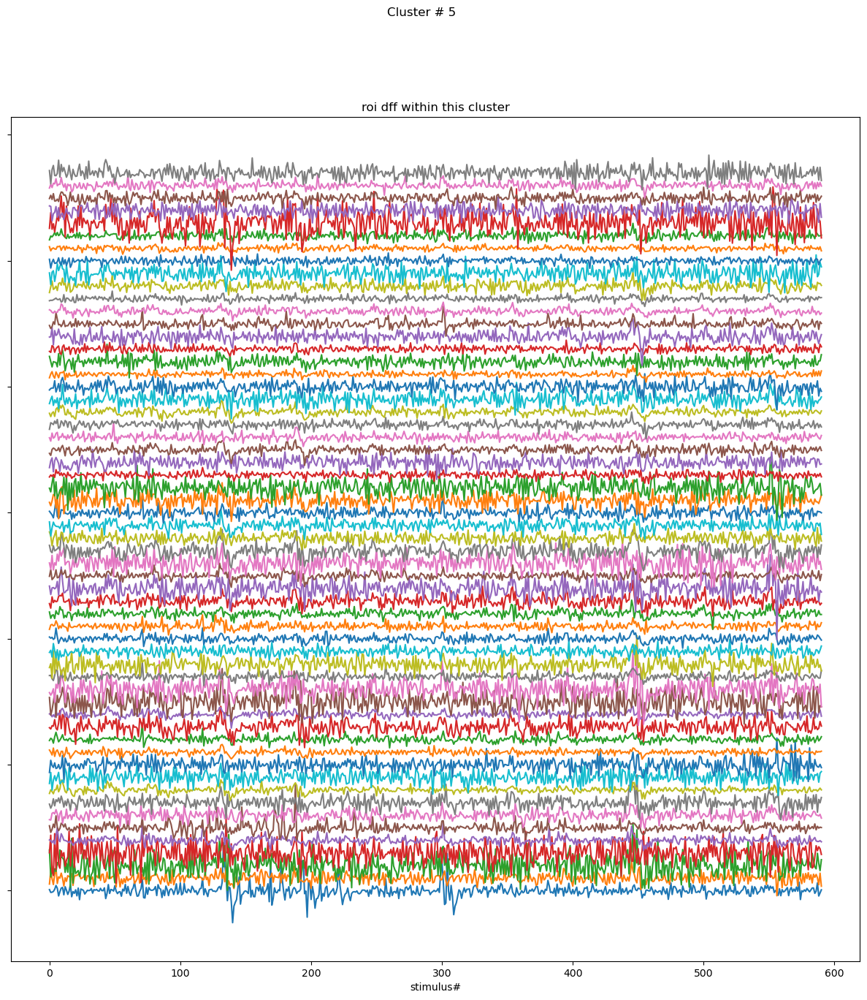

In [50]:
nframes= np.min((resp.shape[1], m.shape[2])) # find number of frames

values, counts = np.unique(big_cluster, return_counts=True)
# count the numbers of rois in each cluster, so we can skip clusters with only 1 roi

for i, c in zip(values, counts):
    if c<2 :
        # skip cluster that 
        pass
    else: 
        cluster_cells= cellstat[big_cluster==i]
        cluster_response= resp[big_cluster==i]
        this_meanresp= np.mean(cluster_response,0)
        this_cycle=dFalign[:,:,big_cluster==i]
        
        sta=np.zeros((m.shape[0],m.shape[1], nframes)) # initialize array to store sta at each second
        for k in np.arange(0,nframes):
            sta[:,:,k]= this_meanresp[k]* m[:,:,k]
        # calculate the sta for this cluster
        
        highsta = util.percentile_sta(this_meanresp, sta, 75, nframes,  high=True)
        lowsta = util.percentile_sta(this_meanresp, sta, 25, nframes, high=False)
        # calculate the stas

        max_ind = np.unravel_index(np.argmax(highsta, axis=None), highsta.shape)
        # find pixel with max value in this cluster from the high sta

        size_frame_on, size_frame_off= util.find_frame_sz(sz_m, m_full, max_ind, nframes)
        # find 

        fig, axs = plt.subplots(2,4, figsize=(24,15), height_ratios=[1,1], width_ratios=[3,3,3,3])
        # create subplots
        
        center_row= []
        center_col = []
        
        for j in cluster_cells:
            center_row.append( j['med'][0])
            center_col.append( j['med'][1])
        
        axs[0,0].imshow(cluster_response, aspect='auto', vmin=0, vmax=0.1, interpolation='None')
        axs[0,0].set_xlabel('stimulus')
        axs[0,0].set_title('roi mean response during tau window for each frame')
        
        
        axs[0,1].imshow(ops['meanImg'], cmap='gray')
        axs[0,1].scatter(center_col, center_row, s= 3, alpha= 0.8, color='r')
        axs[0,1].axis('off')
        axs[0,1].set_title('roi location on mean image')
        
        axs[0,2].boxplot(this_meanresp)
        axs[0,2].set_title('mean response distribution')
        
        axs[0,3].hist(this_meanresp, bins='auto')
        axs[0,3].axvline(np.percentile(this_meanresp, 75), color= 'k')
        axs[0,3].axvline(np.percentile(this_meanresp, 25), color= 'k')
        axs[0,3].set_title('mean response distribution- histplot with 75% and 25% percentile')
        # find distribution of resp
        
        im= axs[1,0].imshow(highsta.T, cmap='coolwarm')
        plt.colorbar(im, shrink=0.5, ax=axs[1,0])
        axs[1,0].set_title('mean high STA (response>75% percentile)')
        im1= axs[1,1].imshow(lowsta.T, cmap='coolwarm')
        plt.colorbar(im1, shrink=0.5, ax=axs[1,1])
        axs[1,1].set_title('mean low STA (response<25% percentile)')
        
        util.plot_sz_effects(this_cycle, size_frame_on, axs[1,2], 'ON') 
        util.plot_sz_effects(this_cycle, size_frame_off, axs[1,3], 'OFF') 
        
        fig.suptitle(f'Clucter {i}, n= {c}')

        stagger_df= np.zeros_like(cluster_response)
        for k in range(0,cluster_response.shape[0]):
            this_roi= cluster_response[k,:]+ k*0.1 
            #add an arbitrary value so the traces are not on top of each other
            stagger_df[k,:]= this_roi
        
        fig2,ax2 = plt.subplots(figsize=(15,15))
        
        ax2.plot(stagger_df.T) # need to plot the transposed array because plt.plot consideres columns to be lines
        ax2.set(yticklabels=[])
        ax2.set_xlabel('stimulus#')
        ax2.set_title("roi dff within this cluster")
                
        fig2.suptitle(f'Cluster # {i}')
        
        PDF.savefig(fig) # save in pdf INSIDE for loop so each for loop is one page!!!
        PDF.savefig(fig2)


    

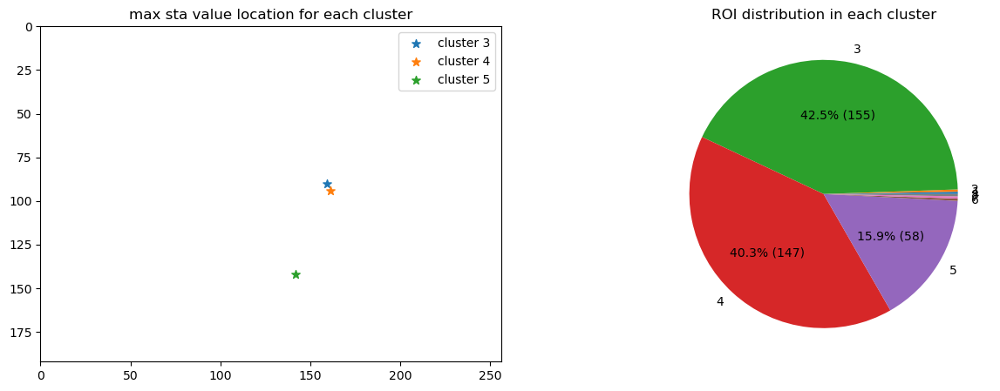

In [53]:
fig, ax= plt.subplots(1,2,figsize=(15,5))

for i, c in zip(values, counts):
    if c<2 :
        # skip cluster that 
        pass
    else: 
        cluster_cells= cellstat[big_cluster==i]
        cluster_response= resp[big_cluster==i]
        this_meanresp= np.mean(cluster_response,0)
        this_cycle=dFalign[:,:,big_cluster==i]
        
        highsta = util.percentile_sta(this_meanresp, sta, 75, nframes, high=True) # calculate high sta
        max_ind = np.unravel_index(np.argmax(highsta, axis=None), highsta.shape) # get maximum value from high sta

        ax[0].scatter(max_ind[0], max_ind[1], marker="*", s=50, label=f'cluster {i}')

ax[0].set_xlim(0,highsta.shape[0]) # set xlim and ylim to match the stimulus image dimension
ax[0].set_ylim(0,highsta.shape[1])
ax[0].invert_yaxis() # need to invert y since on am image 0,0 is the top left corner
ax[0].legend(loc='best')
ax[0].set_title('max sta value location for each cluster')


# plot distribution % and numbers of each ROI in clusters
unique, counts = np.unique(big_cluster, return_counts=True)
autopct= lambda p:f'{p:.1f}% ({p*sum(counts)/100 :.0f}) ' if p>1 else None 
# supress labels for clusters with only 1 roi
ax[1].pie(counts, labels=unique, autopct=autopct)
ax[1].set_title('ROI distribution in each cluster')

PDF.savefig(fig)
plt.show()

In [55]:
# close the PDF
PDF.close()